In [1]:
#Imports

import os
import json
import shutil
import random
import numpy as np
import tensorflow as tf
import keras

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from pathlib import Path

from keras.utils import image_dataset_from_directory
from keras import layers

In [2]:
seed = 123
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [3]:
img_exts = {".jpg", ".jpeg", ".png"}

In [4]:
train_ratio, val_ratio = 0.70, 0.15
batch_size = 32
image_size = (224, 224)
input_shape = (224, 224, 3)
img_exts = {".jpg", ".jpeg", ".png"}

In [5]:
#Dynamic relative path
source_dir = Path("wikiart")

In [6]:
class_dirs = sorted(source_dir.iterdir())
class_names = [d.name for d in class_dirs]
n_classes = len(class_names)

### basic information

In [7]:
print(f"Number of authors : {n_classes}")
print(f"Authors           : {class_names}\n")

Number of authors : 23
Authors           : ['Albrecht_Durer', 'Boris_Kustodiev', 'Camille_Pissarro', 'Childe_Hassam', 'Claude_Monet', 'Edgar_Degas', 'Eugene_Boudin', 'Gustave_Dore', 'Ilya_Repin', 'Ivan_Aivazovsky', 'Ivan_Shishkin', 'John_Singer_Sargent', 'Marc_Chagall', 'Martiros_Saryan', 'Nicholas_Roerich', 'Pablo_Picasso', 'Paul_Cezanne', 'Pierre_Auguste_Renoir', 'Pyotr_Konchalovsky', 'Raphael_Kirchner', 'Rembrandt', 'Salvador_Dali', 'Vincent_van_Gogh']



In [8]:

counts = {}
for class_dir in class_dirs:
    images = [f for f in class_dir.iterdir() if f.suffix.lower() in img_exts]
    counts[class_dir.name] = len(images)

total = sum(counts.values())
print(f"Total paintings    : {total}")
print(f"Min : {min(counts.values())} ({min(counts, key=counts.get)})")
print(f"Max : {max(counts.values())} ({max(counts, key=counts.get)})\n")

Total paintings    : 13340
Min : 336 (Salvador_Dali)
Max : 1322 (Vincent_van_Gogh)



In [9]:
print("Paintings per author:")
for name, count in sorted(counts.items(), key=lambda x: -x[1]):

    print(f" {name:30s} : {count:4d}")

Paintings per author:
 Vincent_van_Gogh               : 1322
 Nicholas_Roerich               : 1274
 Pierre_Auguste_Renoir          :  975
 Claude_Monet                   :  934
 Pyotr_Konchalovsky             :  644
 Camille_Pissarro               :  621
 Albrecht_Durer                 :  580
 John_Singer_Sargent            :  549
 Rembrandt                      :  544
 Marc_Chagall                   :  536
 Pablo_Picasso                  :  534
 Gustave_Dore                   :  528
 Boris_Kustodiev                :  444
 Edgar_Degas                    :  428
 Paul_Cezanne                   :  406
 Ivan_Aivazovsky                :  404
 Martiros_Saryan                :  403
 Eugene_Boudin                  :  389
 Childe_Hassam                  :  385
 Ilya_Repin                     :  378
 Ivan_Shishkin                  :  364
 Raphael_Kirchner               :  362
 Salvador_Dali                  :  336


In [10]:
inbalance_ratio = max(counts.values()) / min(counts.values())
print(f"\ninbalance ratio (max/min) : {inbalance_ratio:.2f}x")
if inbalance_ratio > 3:
    print("Significant inbalance")
else:
    print("NO significant inbalance")


inbalance ratio (max/min) : 3.93x
Significant inbalance


In [11]:
### Calculate Class Weights 
# Formula used: w_j = n_samples / (n_classes * n_samples_j)
class_weights = {}
for i, class_name in enumerate(class_names):
    count = counts[class_name]
    weight = total / (n_classes * count)
    class_weights[i] = weight

In [12]:
# Save class weights for Phase 2
with open('..\class_weights.json', 'w') as f:
    json.dump(class_weights, f)

In [13]:
print("\nClass Weights Dictionary (Save this for Phase 2 model.fit pass it into the class_weight argument of model.fit()):")
for i, w in class_weights.items():
    print(f" Class {i:2d} ({class_names[i]:20s}) : {w:.4f}")


Class Weights Dictionary (Save this for Phase 2 model.fit pass it into the class_weight argument of model.fit()):
 Class  0 (Albrecht_Durer      ) : 1.0000
 Class  1 (Boris_Kustodiev     ) : 1.3063
 Class  2 (Camille_Pissarro    ) : 0.9340
 Class  3 (Childe_Hassam       ) : 1.5065
 Class  4 (Claude_Monet        ) : 0.6210
 Class  5 (Edgar_Degas         ) : 1.3551
 Class  6 (Eugene_Boudin       ) : 1.4910
 Class  7 (Gustave_Dore        ) : 1.0985
 Class  8 (Ilya_Repin          ) : 1.5344
 Class  9 (Ivan_Aivazovsky     ) : 1.4356
 Class 10 (Ivan_Shishkin       ) : 1.5934
 Class 11 (John_Singer_Sargent ) : 1.0565
 Class 12 (Marc_Chagall        ) : 1.0821
 Class 13 (Martiros_Saryan     ) : 1.4392
 Class 14 (Nicholas_Roerich    ) : 0.4553
 Class 15 (Pablo_Picasso       ) : 1.0861
 Class 16 (Paul_Cezanne        ) : 1.4286
 Class 17 (Pierre_Auguste_Renoir) : 0.5949
 Class 18 (Pyotr_Konchalovsky  ) : 0.9006
 Class 19 (Raphael_Kirchner    ) : 1.6022
 Class 20 (Rembrandt           ) : 1.0662
 C


### Data preprocessing

In [14]:
data_dir_path = Path("wikiart_split")

In [15]:
# spliting the dataset

if not data_dir_path.exists():

    for class_dir in sorted(source_dir.iterdir()):
        images = [f for f in class_dir.iterdir() if f.suffix.lower() in img_exts]
        random.shuffle(images)

        n_train = int(len(images) * train_ratio)
        n_val   = int(len(images) * val_ratio)

        splits = {
            "train": images[:n_train],
            "val"  : images[n_train:n_train + n_val],
            "test" : images[n_train + n_val:]
        }

        for split_name, files in splits.items():
            dest = data_dir_path / split_name / class_dir.name
            dest.mkdir(parents=True, exist_ok=True)
            for f in files:
                shutil.copy2(f, dest / f.name)

    print("Dataset split complete.")
else:
    print("Split already exists — skipping.")

Split already exists — skipping.


In [17]:
# loading the datasets - Added crop_to_aspect_ratio=True to prevent image distortion

train_ds = image_dataset_from_directory(
    data_dir_path / "train",
    label_mode="categorical", 
    batch_size=batch_size,
    image_size=image_size,
    crop_to_aspect_ratio=True,
    shuffle=True, 
    seed=seed
)
val_ds = image_dataset_from_directory(
    data_dir_path / "val",
    label_mode="categorical",
    batch_size=batch_size,
    image_size=image_size, 
    crop_to_aspect_ratio=True,
    shuffle=False, 
    seed=seed
)
test_ds = image_dataset_from_directory(
    data_dir_path / "test",
    label_mode="categorical", 
    batch_size=batch_size,
    image_size=image_size, 
    crop_to_aspect_ratio=True,
    shuffle=False, 
    seed=seed
)

class_names = train_ds.class_names
n_classes   = len(class_names)
print(f"\nClasses ({n_classes}): {class_names}")

Found 9326 files belonging to 23 classes.
Found 1992 files belonging to 23 classes.
Found 2022 files belonging to 23 classes.

Classes (23): ['Albrecht_Durer', 'Boris_Kustodiev', 'Camille_Pissarro', 'Childe_Hassam', 'Claude_Monet', 'Edgar_Degas', 'Eugene_Boudin', 'Gustave_Dore', 'Ilya_Repin', 'Ivan_Aivazovsky', 'Ivan_Shishkin', 'John_Singer_Sargent', 'Marc_Chagall', 'Martiros_Saryan', 'Nicholas_Roerich', 'Pablo_Picasso', 'Paul_Cezanne', 'Pierre_Auguste_Renoir', 'Pyotr_Konchalovsky', 'Raphael_Kirchner', 'Rembrandt', 'Salvador_Dali', 'Vincent_van_Gogh']


## Visual Exploratory Data Analysis (The "Phenomena")


Generating comprehensive Visual EDA: 5 paintings per artist...


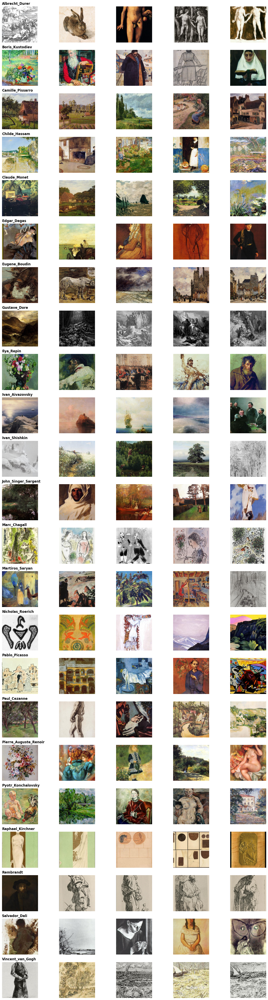

In [18]:
print("\nGenerating comprehensive Visual EDA: 5 paintings per artist...")

# Create a very tall figure to accommodate 23 rows (one for each artist)
plt.figure(figsize=(15, 50)) 

train_dir = data_dir_path / "train"

for i, artist_name in enumerate(class_names):
    artist_folder = train_dir / artist_name
    
    # Grab the first 5 valid images from this artist's folder
    artist_images = [f for f in artist_folder.iterdir() if f.suffix.lower() in img_exts][:5]
    
    for j, img_path in enumerate(artist_images):
        # Create a subplot grid: 23 rows, 5 columns
        ax = plt.subplot(n_classes, 5, i * 5 + j + 1)
        
        # Read and display the image
        img = mpimg.imread(str(img_path))
        plt.imshow(img)
        plt.axis("off")
        
        # Add the artist's name as a title only to the first image in their row
        if j == 0:
            plt.title(artist_name, fontsize=12, fontweight="bold", loc="left")

plt.tight_layout()
plt.show()

**Hey team,**

**What I Did**
I wrote a script that loops through our 23 artist folders and pulls the first 5 images from each to create a massive 23x5 grid. It basically gives us a bird's-eye view of the exact data we are feeding the model right out of the gate.

**What I Found Out (And What We Need to Watch Out For)**
Looking at the grid, there are a few major data quirks we need to keep in mind when designing our architecture and augmentations:

* **The B&W vs. Color Mix:** A lot of our artists (like Dürer, Doré, Rembrandt, and Van Gogh) have a massive split between full-color oil paintings and pure black-and-white sketches.
* *Takeaway:* We have to be really careful with color-based augmentations. If we aggressively apply something like random grayscale to generalize the model, we might accidentally destroy the color features the model relies on for other artists.


* **Massive Subject Bias:** Some artists are basically one-trick ponies when it comes to subject matter. Aivazovsky’s row is almost entirely ocean scenes and ships, while Shishkin’s is completely dominated by forests.
* *Takeaway:* There is a huge risk the model will just learn to classify "is there a boat?" or "is there a tree?" instead of actually learning the artist's unique brushstrokes. We will definitely need to keep a close eye on the confusion matrix to see if the model is cheating here.


* **Signature Palettes:** On the flip side, guys like Saryan, Roerich, and Chagall rely heavily on very specific, localized color palettes (heavy blues, vibrant flats).
* *Takeaway:* We probably want to go easy on `ColorJitter` or hue shifts. If we warp their colors too much, we are destroying the ground-truth signal that makes them recognizable.


* **Fine Lines vs. Blurry Strokes:** We are dealing with extreme texture differences—highly detailed, fine-line engravings right next to blurry, broad impressionist strokes (like Monet or Renoir).
* *Takeaway:* When we inevitably resize these images down (e.g., to 224x224), we risk completely blurring out the fine line details that define the sketch-heavy artists. We need to make sure whatever resizing interpolation method we use preserves those high-frequency details.

In [19]:
# Note: Intentionally excluded color jittering to preserve artist signature palettes.
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomTranslation(0.1, 0.1), # Combats subject bias
    layers.RandomZoom(0.1),
    layers.RandomRotation(0.05)
], name="art_preprocessing_pipeline")

### The "Why" (Your Report Justifications)

**1. Why `RandomTranslation` and `RandomZoom` (Combating Subject Bias)**
Artists like Aivazovsky and Shishkin are heavily biased toward specific subjects (boats and trees). If the model always sees the boat in the exact center of the frame, it will just learn to detect centered boats. By randomly shifting (`RandomTranslation`) and zooming in (`RandomZoom`) on the paintings, you force the model to look at the actual *brushstrokes* in the corners and edges of the canvas, rather than just the primary subject in the middle.

**2. Why  chose `RandomFlip("horizontal")` but excluded `"vertical"´**
Flipping a landscape or portrait horizontally creates a brand-new, valid training image without destroying the artist's technique. However, flipping an image *vertically* (upside down) breaks the physical laws of the painting (e.g., gravity, lighting directions, and sky/ground relationships).

**3. Why EXCLUDE Color Augmentation**
Because artists like Chagall and Roerich rely on "Signature Palettes" and others mix B&W engravings with color oils, mathematically shifting the hues or contrast would destroy the ground-truth color signal that defines these specific authors.

### A Critical Warning for Phase 2 (Gemini Suggestion)

The `Rescaling(1./255)` layer written above assumes your teammates are going to build a Convolutional Neural Network (CNN) completely from scratch.

If your team decides to use **Transfer Learning** (e.g., importing a heavy, pre-trained model like ResNet50, VGG16, or EfficientNet to get higher accuracy), you **must delete the Rescaling layer** (ALREADY REMOVED). Pre-trained models have their own highly specific mathematical preprocessing functions (like `keras.applications.resnet50.preprocess_input`) that you must use instead, otherwise the transfer learning will completely fail.

In [20]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)